Single Image Processing
===


In [1]:
#from tools import init
import os
import tools
import glob
import cv2
import numpy as np
import pickle
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import scipy
from scipy import signal
from collections import deque

out_dir = 'output_images/step2/'

tools.init()

### Undistort test images with visualization

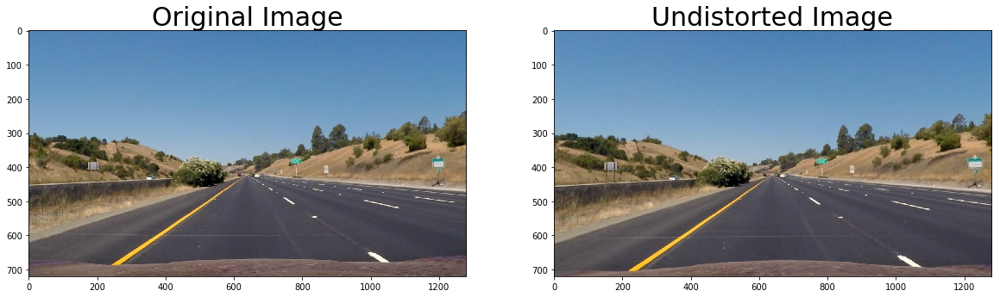

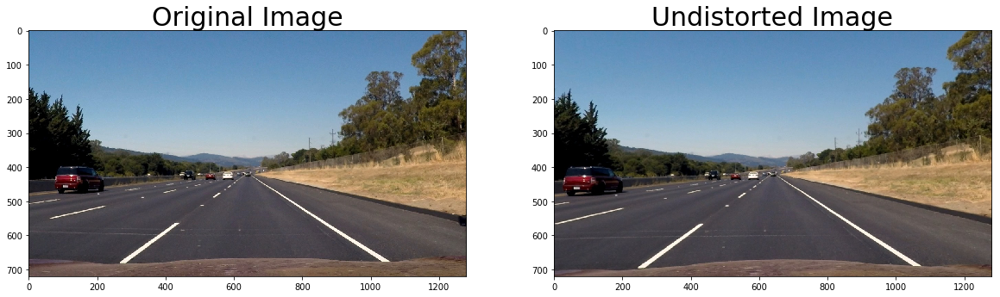

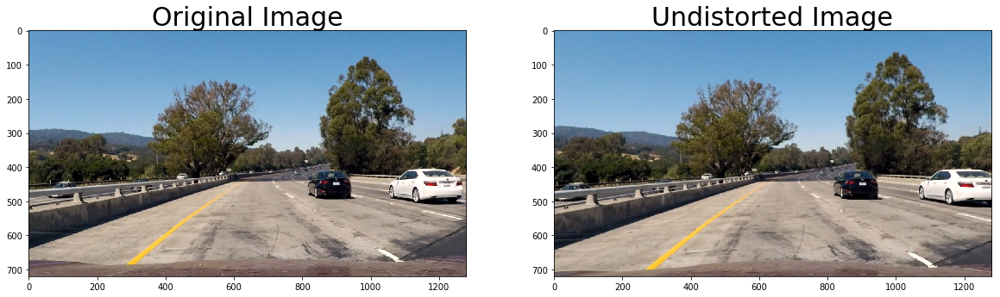

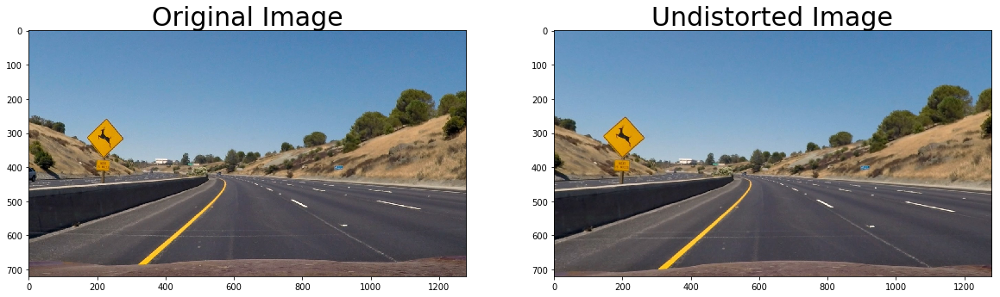

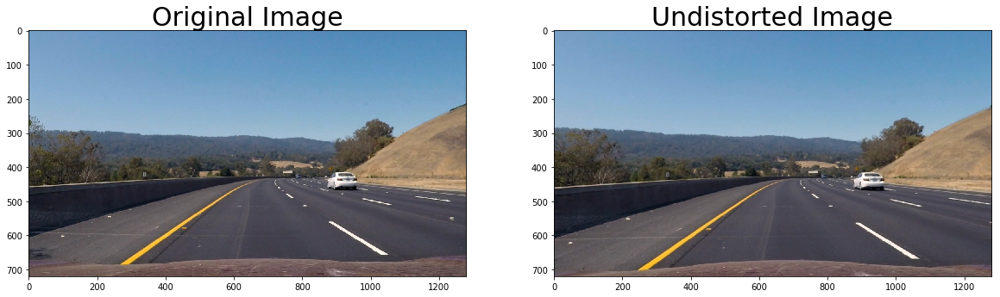

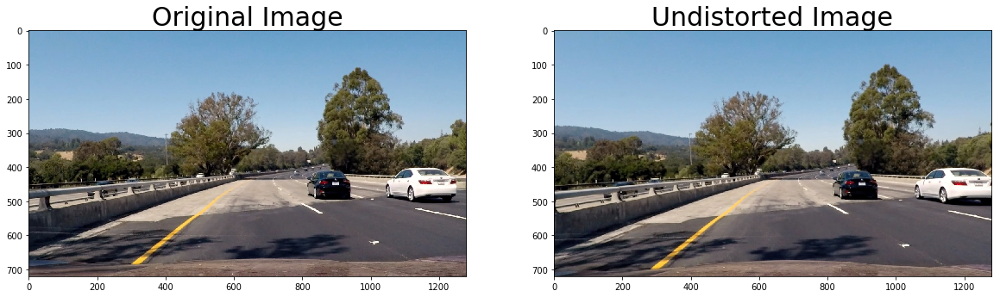

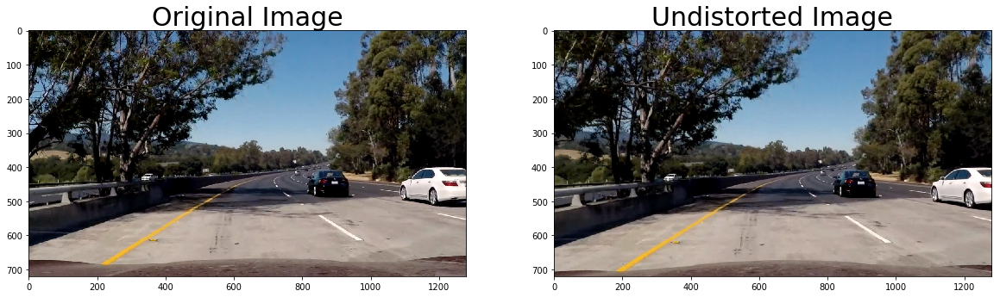

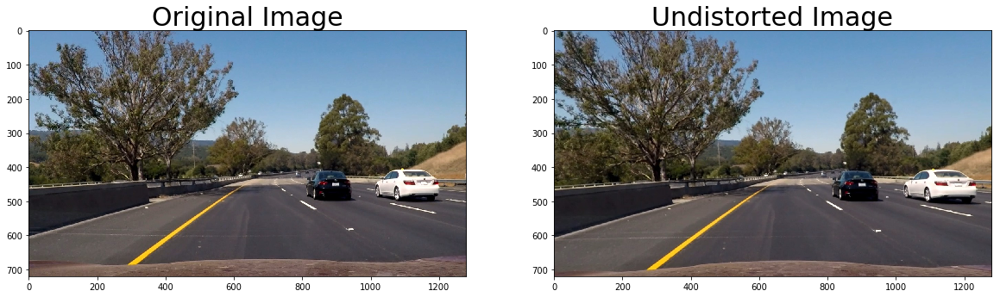

In [2]:
# Undistort test images with visualization
%matplotlib inline

images = glob.glob('test_images/*.jpg')

gs = gridspec.GridSpec(8, 2)
gs.update(wspace=0.01, hspace=0.02) # set the spacing between axes.
plt.figure(figsize=(8,2))

for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    dst = tools.undistort_img(img)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted Image', fontsize=30)
    
    image_name=os.path.split(fname)[1]
    write_name = out_dir + 'undistorted_' + image_name
    cv2.imwrite(write_name,dst)
    
    #cv2.imshow('undistorted', dst)
    #cv2.waitKey(500)

cv2.destroyAllWindows()

### Image binarization

In [3]:
def gaussian_blur(img, kernel_size=3):
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

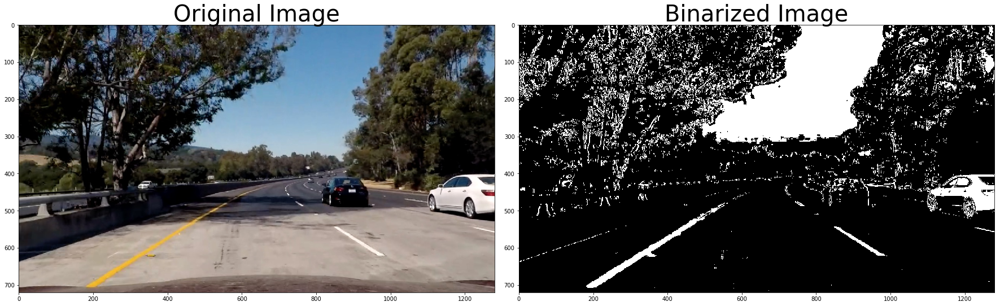

In [4]:
image = mpimg.imread('test_images/test5.jpg')
image = tools.undistort_img(image)
binary,_ = tools.binarize(image)

plt.imsave(out_dir + 'binary_test5.jpg', binary)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(binary)
ax2.set_title('Binarized Image', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

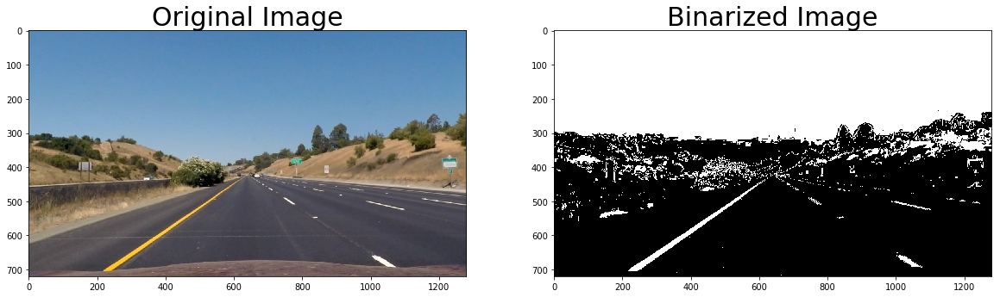

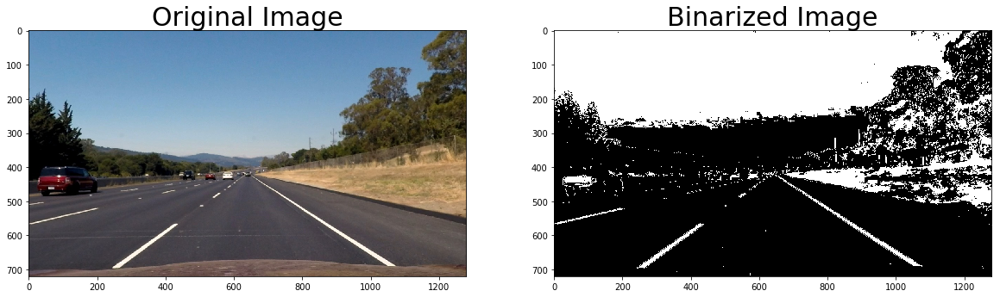

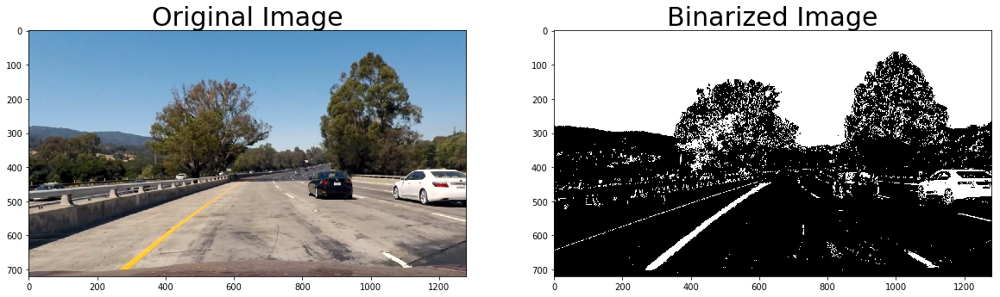

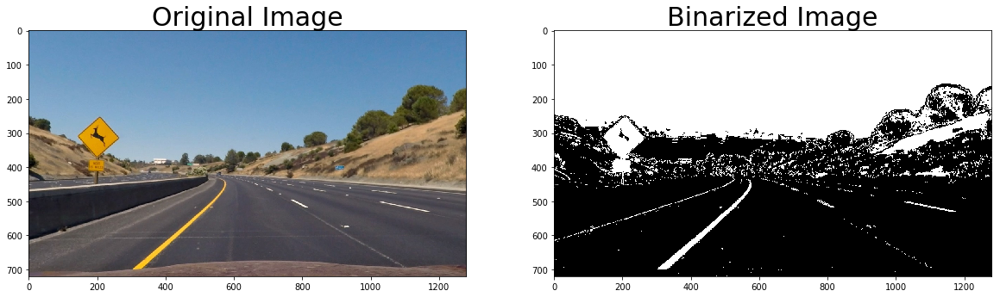

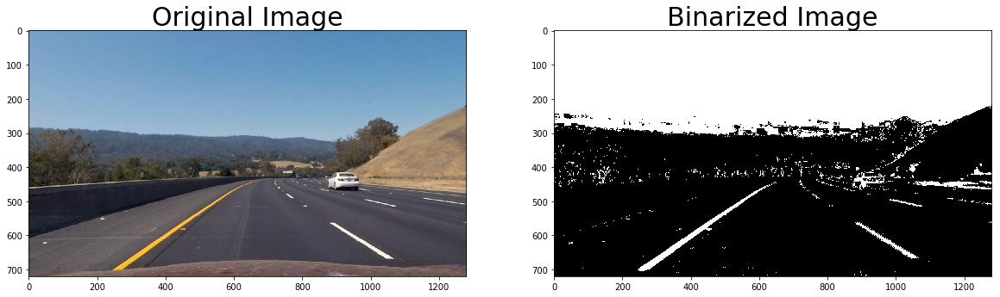

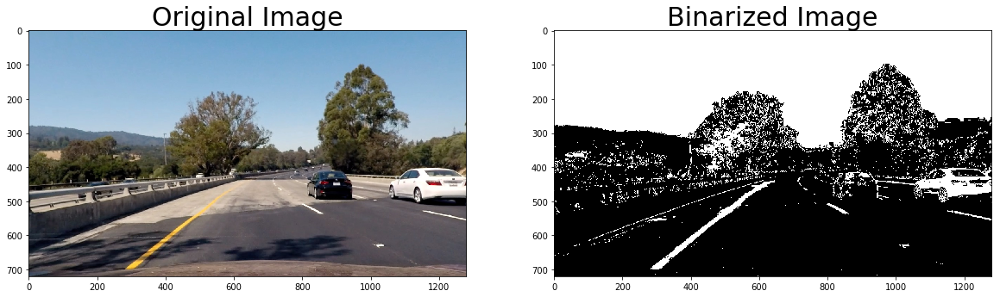

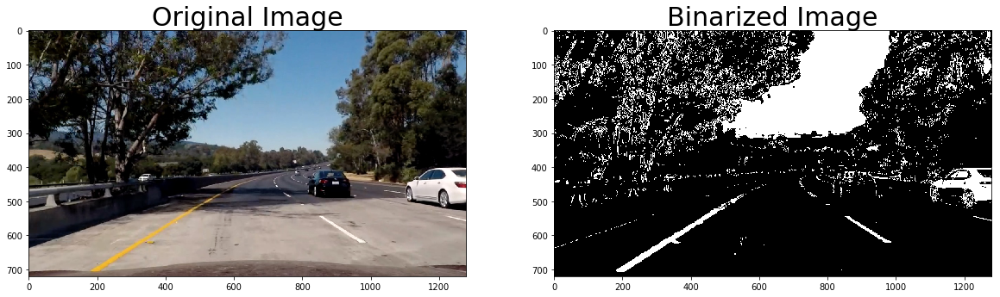

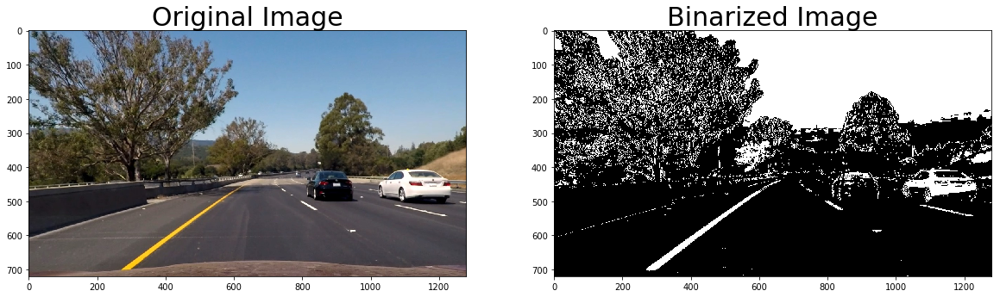

In [5]:
images = glob.glob('test_images/*.jpg')

gs = gridspec.GridSpec(8, 2)
gs.update(wspace=0.01, hspace=0.02) # set the spacing between axes.
plt.figure(figsize=(8,2))

for idx, fname in enumerate(images):
    image = mpimg.imread(fname)
    image = tools.undistort_img(image)
#    image = gaussian_blur(image)
    binary = tools.binarize_img(image)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(binary)
    ax2.set_title('Binarized Image', fontsize=30)
    
    image_name=os.path.split(fname)[1]
    write_name = out_dir + 'binary_' + image_name
    plt.imsave(write_name, binary)
    #print(write_name)

cv2.destroyAllWindows()

### Perspective Transform

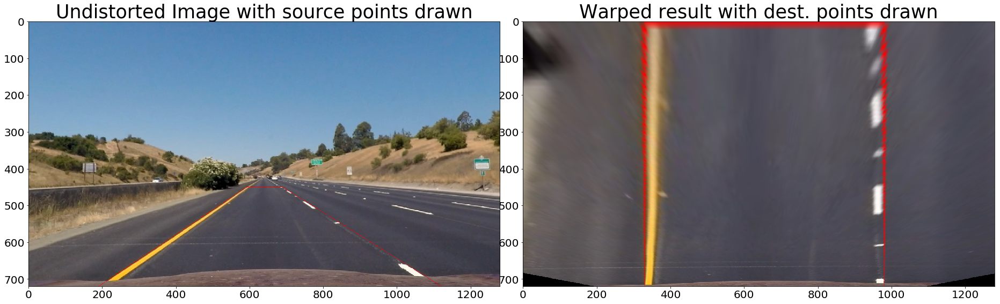

In [6]:
bird_corners = tools.birdview_corners()

image = mpimg.imread('test_images/straight_lines1.jpg')
image = tools.undistort_img(image)

corner_tuples = []
for i,_ in enumerate(bird_corners):
    corner_tuples.append(tuple(bird_corners[i]))

# draw: bottom-left, top-left, top-right, bottom-right
for i, j in [(0,1), (1,2), (2,3), (3,0)]:
    cv2.line(image, corner_tuples[i], corner_tuples[j], color=[255,0,0], thickness=1)

warped = tools.warp_img(image)

plt.imsave(out_dir + 'straight_lines.jpg', image)
plt.imsave(out_dir + 'warped_straight_lines.jpg', warped)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))
f.tight_layout()

ax1.set_title('Undistorted Image with source points drawn', fontsize=35)
ax1.tick_params(axis='both', which='major', labelsize=20)
ax1.imshow(image)

ax2.set_title('Warped result with dest. points drawn', fontsize=35)
ax2.tick_params(axis='both', which='major', labelsize=20)
ax2.imshow(warped)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### ROI to mask noise at the left and right sides of frame

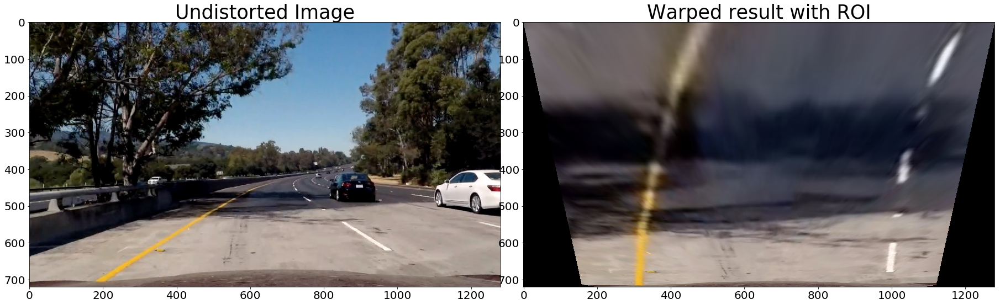

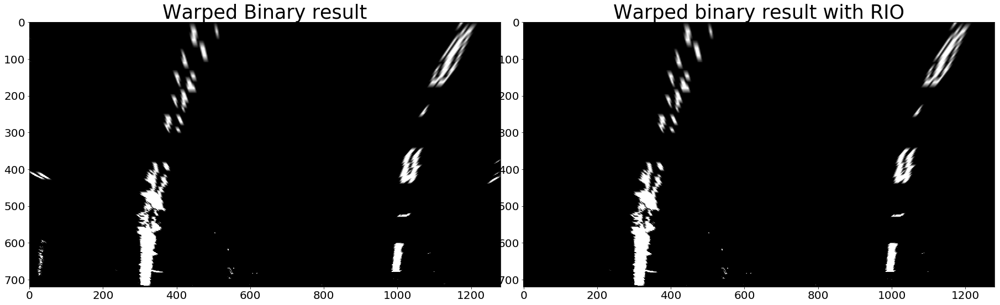

In [7]:
image = mpimg.imread('test_images/test5.jpg')

image = tools.undistort_img(image)
warp = tools.warp_img(image)
warp_roi = tools.ROI(warp)

binary = tools.binarize_img(image)
binary = tools.warp_img(binary)
binary_roi = tools.ROI(binary)

#binary = tools.warp_img(image)
#binary = binarize_img(binary)
#binary_roi = tools.ROI(binary)


# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))
f.tight_layout()

ax1.set_title('Undistorted Image', fontsize=35)
ax1.tick_params(axis='both', which='major', labelsize=20)
ax1.imshow(image)

ax2.set_title('Warped result with ROI', fontsize=35)
ax2.tick_params(axis='both', which='major', labelsize=20)
ax2.imshow(warp_roi)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))
f.tight_layout()

ax1.set_title('Warped Binary result', fontsize=35)
ax1.tick_params(axis='both', which='major', labelsize=20)
ax1.imshow(binary)

ax2.set_title('Warped binary result with RIO', fontsize=35)
ax2.tick_params(axis='both', which='major', labelsize=20)
ax2.imshow(binary_roi)

### Finding Lanes

In [8]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tools import binarize_pipeline
from detect_lane import find_peaks 


pick value:  170.788063957
peak before sigma:  322
peak_x after sigma:  326


C:\Development\Udacity\carnd\P4-Advanced-Lane-Finding\detect_lane.py:28: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  histogram = np.sum(binary[binary.shape[0]/2:,:], axis=0)


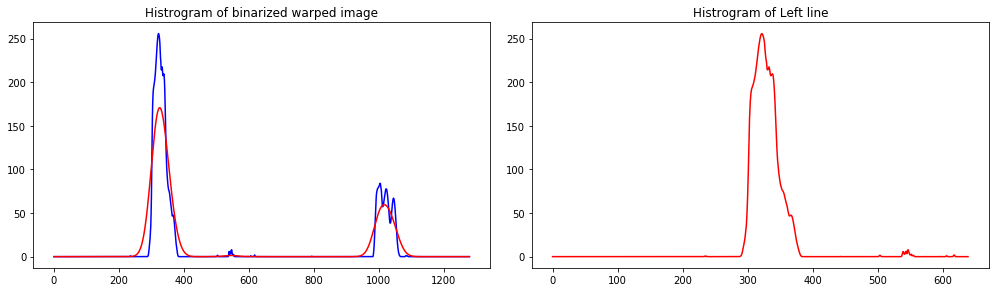

*** final peak_x:  326
pick value:  59.6443209117
peak before sigma:  1004
peak_x after sigma:  1017


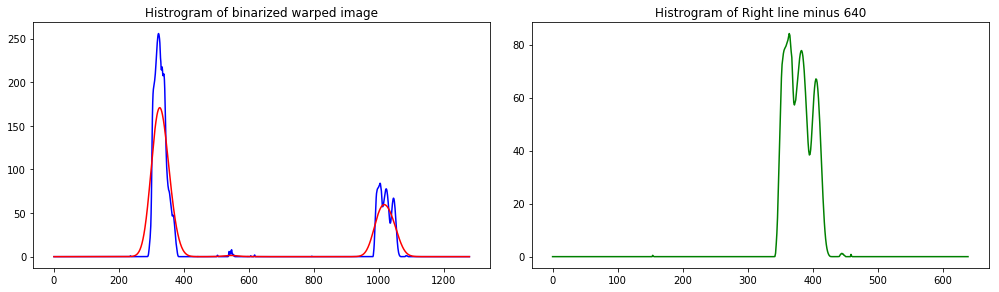

*** final peak_x:  1017


In [9]:
# Test find_peaks
from detect_lane import find_peaks 

img = mpimg.imread('test_images/test5.jpg')

binary = binarize_pipeline(img)
left_peak = find_peaks(binary, 300, verbose=True)    
right_peak = find_peaks(binary, 1000, verbose=True)    


left_peak: 326
right_peak: 1017
left_fit:  [  2.61783165e-04  -4.28694692e-01   4.83974233e+02]
right_fit:  [  4.43548148e-04  -5.90558523e-01   1.19727694e+03]


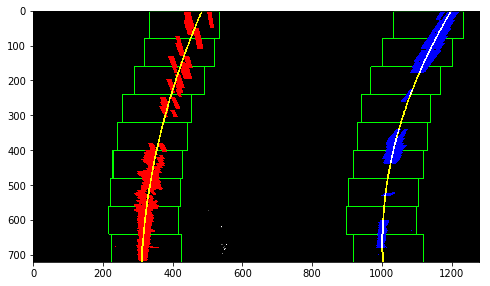

In [10]:
# Detect left and right lines
from detect_lane import detect_line, draw_lanes_with_windows 

%matplotlib inline

print('left_peak:', left_peak)
print('right_peak:', right_peak)

# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary, binary, binary))*255

#left_peak = 0
#right_peak = 0

leftx = np.empty(shape=(0,0))
lefty = np.empty(shape=(0,0))
left_fit = np.empty(shape=(0,0))
left_win_rects = np.empty(shape=(0,0))
rightx = np.empty(shape=(0,0))
righty = np.empty(shape=(0,0))
right_fit = np.empty(shape=(0,0))
right_win_rects = np.empty(shape=(0,0))

if left_peak > 0:
    (leftx, lefty), left_fit, left_win_rects = detect_line(binary, left_peak, verbose=True)
if right_peak > 0:
    (rightx, righty), right_fit, right_win_rects = detect_line(binary, right_peak, verbose=True)

print('left_fit: ', left_fit)
print('right_fit: ', right_fit)
    
out_img = draw_lanes_with_windows(binary,
                                leftx, lefty, left_fit,
                                rightx, righty, right_fit,
                                left_win_rects, right_win_rects)

plt.figure(figsize=(8,8))
plt.xlim(0, 1280)
plt.ylim(720, 0) 
plt.imshow(out_img)


(720, 0)

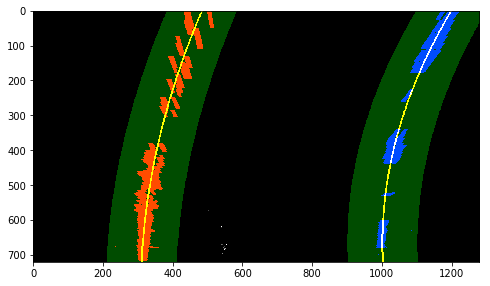

In [11]:
from detect_lane import detect_line_in_roi, draw_detect_line_in_roi

leftx1=[]
lefty1=[]
left_fit1=[]

if len(left_fit):
    (leftx1, lefty1), left_fit1 = detect_line_in_roi(binary, left_fit)
(rightx1, righty1), right_fit1 = detect_line_in_roi(binary, right_fit)

out_img = draw_detect_line_in_roi(binary, left_fit1, leftx1, lefty1, right_fit1, rightx1, righty1)

plt.figure(figsize=(8,8))
plt.imshow(out_img)
plt.xlim(0, out_img.shape[1])
plt.ylim(out_img.shape[0], 0)


In [12]:
from detect_lane import Line
from detect_lane import process_image_ex

Verbose=True
frame_Ind = 0;

def process_image(img):
    global Verbose
    global frame_Ind
    return process_image_ex(img, leftL, rightL, frame_Ind, verbose=Verbose)

In [13]:
# Read in a thresholded image
img = mpimg.imread('test_images/test5.jpg')

leftL  = Line(327, img.shape[1], 8)
rightL = Line(1018, img.shape[1], 8)

C:\Development\Udacity\carnd\P4-Advanced-Lane-Finding\detect_lane.py:28: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  histogram = np.sum(binary[binary.shape[0]/2:,:], axis=0)


pick value:  170.788063957
peak before sigma:  322
peak_x after sigma:  326


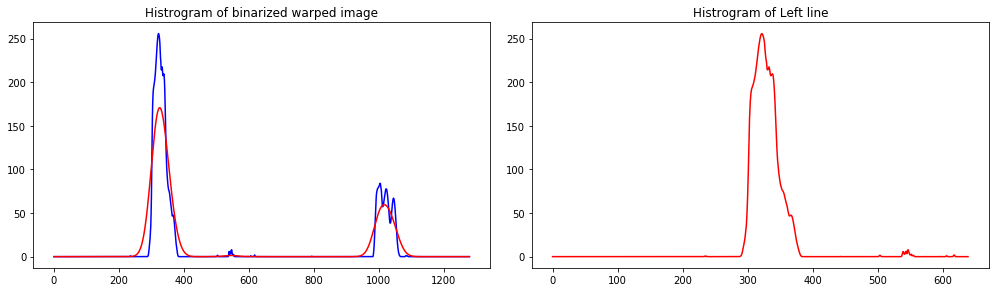

*** final peak_x:  326
pick value:  59.6443209117
peak before sigma:  1004
peak_x after sigma:  1017


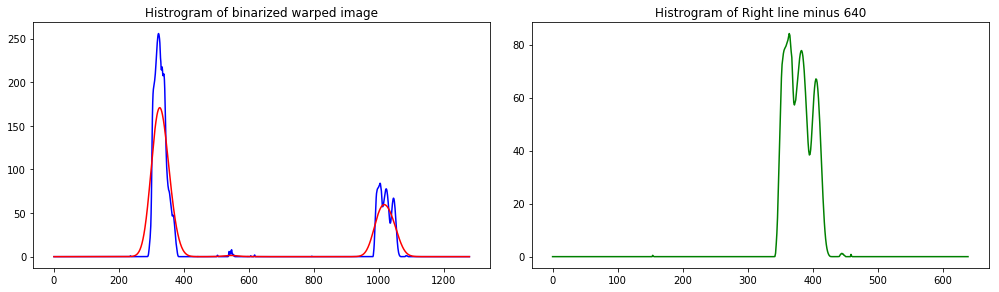

*** final peak_x:  1017


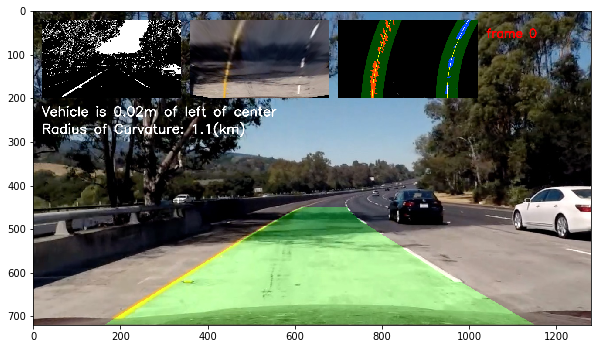

In [14]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

result = process_image(img)
result = process_image(img)

plt.figure()
plt.figure(figsize=(10,8))
plt.imshow(result)
plt.show()
plt.imsave(out_dir + 'projected_lane_test5.jpg',result)